## ViT For Time series Images Cloud Recovery

**Description**

This mainly focuses on the image reconstruction performance before and after incorporating temporal sequences, after encoding the time parameters.


The input image format is [batch_size, channel, Width, Height], for example [10, 66, 180, 180]

In [ ]:
# --------------------------------------------------------------------
# Importing required libraries
# --------------------------------------------------------------------
import random
import numpy as np
import pandas as pd
import PIL.Image as Image
from glob import glob
from mymodels import (
    VisionTransformer,
    ReconNet,
    VisionTransformerTimeSeries,
    VisionTransformerTimeSeriesFormalized,
)
from mymodels.unet import Unet
from mymodels.discriminatorv2 import Discriminator
import matplotlib.pyplot as plt
from myutils import imshow
from datetime import datetime

# importing pytorch functions
import torch
from torchvision.utils import make_grid
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as tvtransforms
from torch.nn import SmoothL1Loss, BCELoss

# importing utils required in th code
from utils import subsample
from utils import transforms
from utils.evaluate import ssim, psnr, nmse
from utils.losses import SSIMLoss, SSIMLoss_V1, MultiScaleLoss
from utils.process import transform_tensor_image, RealisticCloudMaskFunc
from osgeo import gdal
import torch.nn.functional as F

# Device
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"
# np.random.seed(42)
# random.seed(42)

print("******* STARTED AT ************", datetime.now())

/home/snt/miniconda3/envs/causal_vit_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/snt/miniconda3/envs/causal_vit_env/lib/python3.10/site-packages/timm/models/helpers.py:7: FutureWarning: Importing from timm.models.helpers is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/home/snt/miniconda3/envs/causal_vit_env/lib/python3.10/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


******* STARTED AT ************ 2025-01-04 15:04:42.779499


## Initialization 

In [ ]:
class ImagenetDataset(Dataset):
    def __init__(self, isval=False):
        if isval:
            ## combine paths of each imagenet validation image into a single list
            self.files = []
            pattern = "*.tif"
            for dir, _, _ in os.walk(
                "/home/snt/projects_lujun/vitCausalSeries/data/intermediate/output_patches_time_series_with_city/val"
            ):
                self.files.extend(glob(os.path.join(dir, pattern)))
        else:
            ## combine paths of each imagenet training image into a single list
            self.files = []  # get path of each imagenet images
            pattern = "*.tif"
            for dir, _, _ in os.walk(
                "/home/snt/projects_lujun/vitCausalSeries/data/intermediate/output_patches_time_series_with_city/train"
            ):
                self.files.extend(glob(os.path.join(dir, pattern)))

        self.transform = transform_tensor_image
        self.factors = [2, 3, 4, 5, 6, 7, 8, 9, 10]

    ## This function reads the tiff image and returns the image as a numpy array
    ## Read tiff files using gdal is shitty, try to use numpy or other format.
    def read_tiff(self, file_path):
        dataset = gdal.Open(file_path)
        if not dataset:
            raise FileNotFoundError(f"Unable to open the file: {file_path}")
        band_count = dataset.RasterCount
        bands_data = []
        for i in range(1, band_count + 1):
            band = dataset.GetRasterBand(i)
            band_name = band.GetDescription()
            band_data = band.ReadAsArray()
            bands_data.append(band_data)

        image = np.stack(bands_data, axis=0)
        return image

    ## This function returns the mask function based on the sampling style and factor
    def get_mask_func(self, samp_style, factor,):
        center_fractions = 0.08 * 4 / factor
        if samp_style == "random":
            mask_func = subsample.RandomMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        elif samp_style == "equidist":
            mask_func = subsample.EquispacedMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        return mask_func

    def add_gaussian_noise(self, x):
        ch, row, col = x.shape
        mean = 0
        var = 0.05
        sigma = var**0.5
        gauss = np.random.normal(mean, sigma, (ch, row, col))
        gauss = gauss.reshape(ch, row, col)
        noisy = x + gauss
        return noisy.float()

    def __len__(
        self,
    ):
        return len(self.files)

    def __getitem__(self, idx):
        tiff = torch.from_numpy(self.read_tiff(self.files[idx]))
        tiff = self.transform(tiff, target_size=64 * 3, crop_size=60 * 3)
        channels, height, width = tiff.shape
        time_span = int((channels - 1) / 11)
        images = np.split(tiff, [11 * (i + 1) for i in range(time_span)], axis=0)
        original_spaces_transformed = []
        masked_spaces = []
        cloud_masks = []
        added_cloud_masks = []
        for i in range(len(images) - 1):
            y = images[i]
            cloud_mask = torch.isnan(y).any(dim=0)
            cloud_mask = (~cloud_mask).int()
            y[:, cloud_mask == 0] = 0
            original_spaces_transformed.append(y.clone())
            masked_kspace = y.clone()

            if random.uniform(0, 1) < 0.5:
                y = torch.rot90(y, 1, [-2, -1])

            if random.uniform(0, 1) < 0.5:
                samp_style = "random"
            else:
                samp_style = "equidist"

            # factor = random.choice(self.factors)
            mask_func = self.get_mask_func(samp_style, factor=1.0)

            masked_kspace, _ = transforms.apply_mask(masked_kspace, mask_func)
            masked_kspace, added_cloud_mask = RealisticCloudMaskFunc(masked_kspace)
            added_cloud_masks.append(added_cloud_mask.unsqueeze(0))
            masked_spaces.append(masked_kspace)
            cloud_masks.append(cloud_mask.unsqueeze(0))

        # masked_kspace = self.add_gaussian_noise(y)
        masked_space_concat = torch.cat(masked_spaces, dim=0)
        original_spaces_transformed_concat = torch.cat(
            original_spaces_transformed, dim=0
        )
        
        cloud_mask_concat = torch.cat(cloud_masks, dim=0)
        added_cloud_masks_concat = torch.cat(added_cloud_masks, dim=0)
        return (
            masked_space_concat,  # inputs
            original_spaces_transformed_concat,  # tragets
            cloud_mask_concat,
            added_cloud_masks_concat,
        )


train_dataset = ImagenetDataset()
val_dataset = ImagenetDataset(isval=True)
# ntrain = 200
# train_dataset, _ = torch.utils.data.random_split(
#     train_dataset,
#     [ntrain, len(train_dataset) - ntrain],
#     generator=torch.Generator().manual_seed(42),
# )

batch_size = 15
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

trainloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=2,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)
valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)

Test the mask and future application

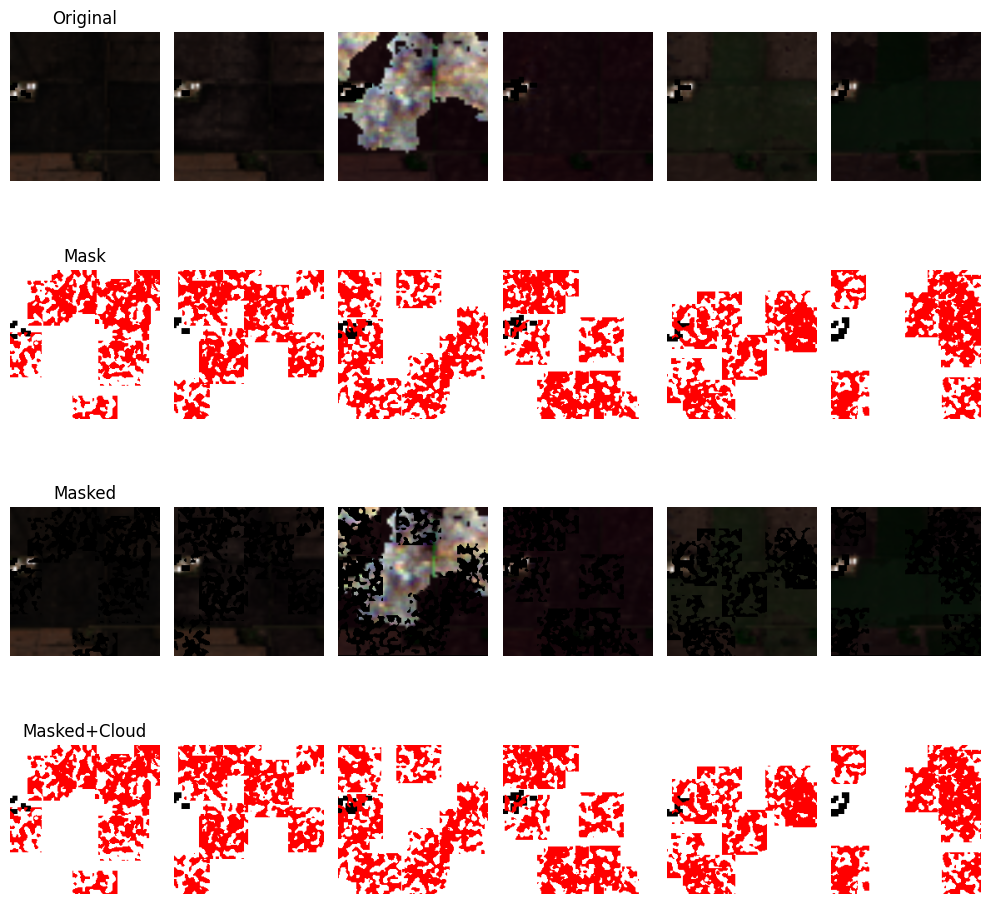

In [3]:
def read_tiff(file_path):
    dataset = gdal.Open(file_path)
    if not dataset:
        raise FileNotFoundError(f"Unable to open the file: {file_path}")
    band_count = dataset.RasterCount
    bands_data = []
    for i in range(1, band_count + 1):
        band = dataset.GetRasterBand(i)
        band_name = band.GetDescription()
        band_data = band.ReadAsArray()
        bands_data.append(band_data)

    image = np.stack(bands_data, axis=0)
    return image


def create_time_series_pseudo_color_image(
    multi_channel_array, cloud_mask, added_cloud_mask
):
    if len(multi_channel_array.shape) != 3:
        raise ValueError("Input Array Shold be H W C")
    channel_list = [3, 2, 1]
    channels, h, w = multi_channel_array.shape
    time_span = int((channels - 1) / 11)
    images = np.split(
        multi_channel_array, [11 * (i + 1) for i in range(time_span)], axis=0
    )
    cloud_masks = np.split(cloud_mask, [i + 1 for i in range(time_span)], axis=0)
    added_cloud_masks = np.split(
        added_cloud_mask, [i + 1 for i in range(time_span)], axis=0
    )
    time_series_images = []
    background_cloud_images = []
    for i, image in enumerate(images):
        image = np.transpose(image, (1, 2, 0))
        pseudo_color_image = image[:, :, channel_list]
        time_series_images.append(pseudo_color_image)

        # nan_mask = np.isnan(pseudo_color_image).any(axis=-1)  # 掩码，标记 NaN 的位置

        background_cloud_image = np.full((h, w, 3), 0, dtype=np.uint8)  # ALL black
        background_cloud_image[cloud_masks[i].squeeze(0) == 1] = [
            255,
            255,
            255,
        ]  # Eecept mask white

        background_cloud_image[added_cloud_masks[i].squeeze(0) == 0] = [
            255,
            0,
            0,
        ]
        background_cloud_images.append(background_cloud_image)

    return time_series_images, background_cloud_images


def test_image_transformation(dataset, idx):

    masked_kspace, original_image, cloud_mask, added_cloud_masks_concat = dataset[idx]
    time_series_images_original, background_cloud_images_original = (
        create_time_series_pseudo_color_image(
            original_image, cloud_mask, added_cloud_masks_concat
        )
    )
    time_series_images_masked, background_cloud_images_masked = (
        create_time_series_pseudo_color_image(
            masked_kspace, cloud_mask, added_cloud_masks_concat
        )
    )
    all_images = [
        time_series_images_original,
        background_cloud_images_original,
        time_series_images_masked,
        background_cloud_images_masked,
    ]

    fig, axes = plt.subplots(
        len(all_images), len(time_series_images_masked), figsize=(10, 10)
    )
    dict_name = {
        0: "Original",
        1: "Mask",
        2: "Masked",
        3: "Masked+Cloud",
    }
    for i, image_list in enumerate(all_images):
        for j in range(len(image_list)):
            axes[i][j].imshow(image_list[j])
            axes[i][j].axis("off")
            if j == 0:  # Add a title only to the first image of each row
                axes[i][j].set_title(dict_name[i + j])

    plt.tight_layout()
    plt.show()


idx = 17
test_image_transformation(train_dataset, idx)

In [ ]:
# --------------------------------------------------------------------
# Initialising Models
# --------------------------------------------------------------------
masked_kspace, _, _, _ = train_dataset[0]
C, H, W = masked_kspace.shape # 11 * 180  * 180

avrg_img_size = 180  # Don't change this
patch_size = 5  # 10
depth = 6 # 6 transformer depths
num_heads = 8  ## head
embed_dim = 64  # 64. #
time_span = C // 11
in_chans = C
epoch = 100
lr = 1e-4

net = VisionTransformerTimeSeriesFormalized(
    avrg_img_size=avrg_img_size,
    patch_size=patch_size,
    in_chans=in_chans,
    embed_dim=embed_dim,
    depth=depth,
    num_heads=num_heads,
    is_LSA=False,  # ---------------Parameter for adding LSA component
    is_SPT=False,  # ---------------Parameter for adding SPT component
    is_CSA=False,
    rotary_position_emb=False,  # ---------------Parameter for adding ROPE component
    use_pos_embed=True,
    use_time_embed=True,
)

model = ReconNet(net).to(device)

# Set biases to zero
for name, param in model.named_parameters():
    if name.endswith(".bias"):
        torch.nn.init.constant_(param, 0)
        param.requires_grad = False

print("#Params:", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(model)


# --------------------------------------------------------------------
# Function to Save model
# --------------------------------------------------------------------
def save_model(path, model, train_hist, optimizer, scheduler=None):
    net = model.net
    if scheduler:
        checkpoint = {
            "model": ReconNet(net),
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler": scheduler.state_dict(),
        }
    else:
        checkpoint = {
            "model": ReconNet(net),
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
        }

    torch.save(train_hist, path + "train_hist.pt")
    torch.save(checkpoint, path + "checkpoint.pth")



"""Choose optimizer"""
# criterion = SSIMLoss_V1(window_size=11, channel=1).to(device)
# criterion = ms_ssim().to(device)
# criterion = piq.ssim().to(device)
criterion = MultiScaleLoss(scales=[1, 0.5, 0.25], weight_mse=1.0, weight_sam=1.0).to(
    device
)

optimizerG = optim.Adam(model.parameters(), lr=0.0)
train_hist = []
path = "./"  # Path for saving model checkpoint and loss history
scheduler = optim.lr_scheduler.OneCycleLR(
    optimizerG,
    max_lr=lr,  # 1e-4
    total_steps=epoch,
    pct_start=0.1,
    anneal_strategy="linear",
    cycle_momentum=False,
    base_momentum=0.0,
    max_momentum=0.0,
    div_factor=0.1 * epoch,
    final_div_factor=9,
)


def check_nan_in_tensors(*tensors):
    for idx, tensor in enumerate(tensors):
        if torch.isnan(tensor).any():
            print(f"Tensor {idx} contains NaN values.")
            return True
    print("No NaN values found in the provided tensors.")
    return False

#Params: 23736794
ReconNet(
  (net): VisionTransformerTimeSeriesFormalized(
    (PatchDeodceTimeSeries): PatchDecodeTimeSeries(
      (deproj): ConvTranspose2d(66, 85, kernel_size=(5, 5), stride=(5, 5))
    )
    (patch_embed): PatchEmbed(
      (proj): Conv2d(66, 512, kernel_size=(5, 5), stride=(5, 5))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0-5): 6 x Block(
        (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (attn): MHSA(
          (attend): Softmax(dim=-1)
          (to_qkv): Linear(in_features=512, out_features=1056, bias=False)
          (to_out): Sequential(
            (0): Linear(in_features=352, out_features=512, bias=True)
            (1): Dropout(p=0.0, inplace=False)
          )
        )
        (temp_attn): MHSA(
          (attend): Softmax(dim=-1)
          (to_qkv): Linear(in_features=512, out_features=1056, bias=False)
          (to_out): Sequential(
            (0): Linear(in_features=352, out_fea

Start to train the model

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0940335..1.5857357].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0306965..1.6883205].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.90975964..1.6598228].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0937997..1.6561171].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0755342..1.950853].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.1284618..2.2181437].


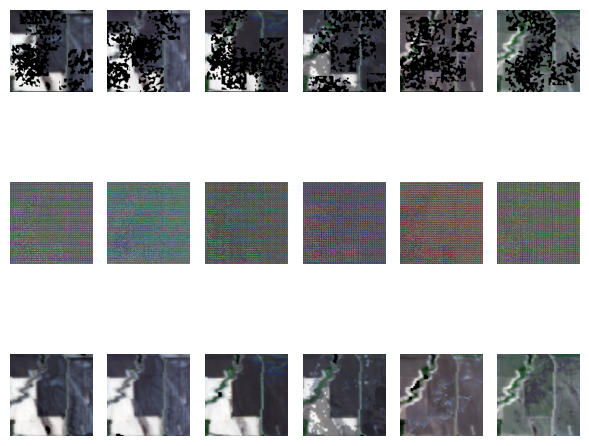

Epoch 1, Train loss.: 3.4729e+00


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08244207..1.0155525].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11127958..1.0894797].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24854086..0.84395].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18221165..0.8177527].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2768095..0.9304105].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13230851..0.8652975].


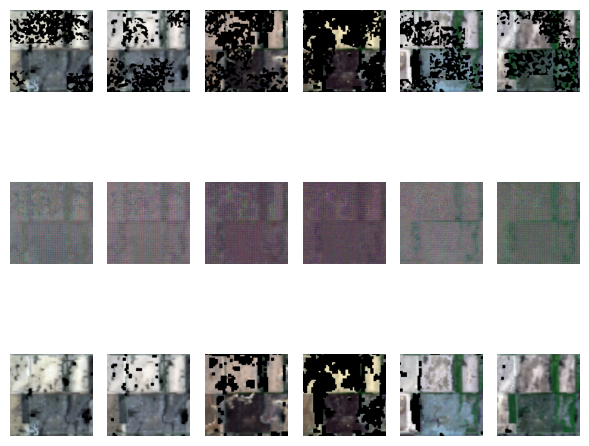

Epoch 2, Train loss.: 1.4948e+00


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.21691418..0.8750753].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09839724..0.88280386].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.28484532..0.81728816].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30269554..0.85825026].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2992318..0.94835913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3556223..0.7605229].


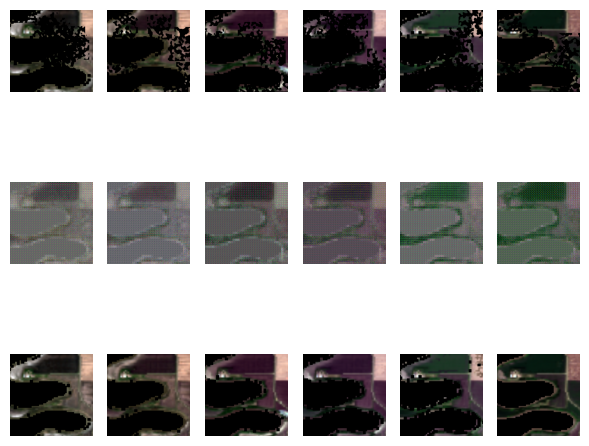

Epoch 3, Train loss.: 1.0427e+00


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006049706..0.89306563].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15232868..0.7832711].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06962905..0.70458823].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025538797..0.7879191].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13037044..0.78874886].


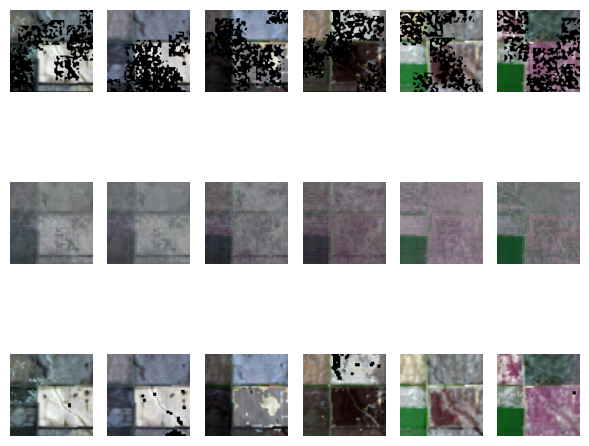

Epoch 4, Train loss.: 9.1149e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034531273..0.8185677].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017773867..0.8167072].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15960965..0.8064232].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1067943..0.8844834].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.179805..0.7424381].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16472365..0.67791647].


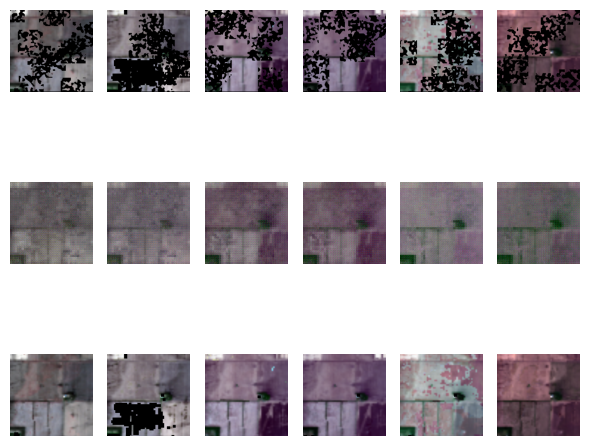

Epoch 5, Train loss.: 8.4087e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11366842..0.86044353].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07535358..0.84686154].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11879353..0.79659957].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11513584..0.6560227].


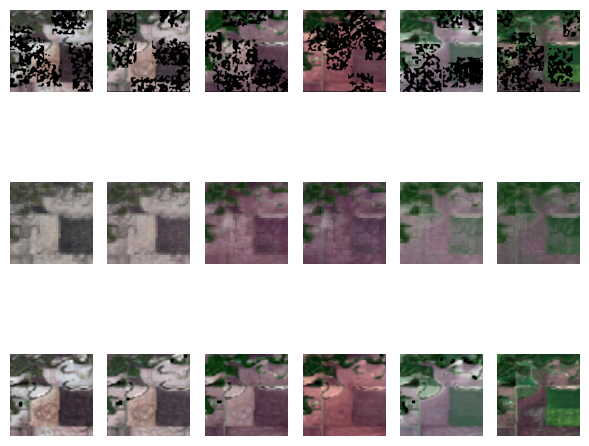

Epoch 6, Train loss.: 7.9404e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.081715964..0.9264632].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.068974555..0.83889407].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.084754676..0.8123191].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059848428..0.7673458].


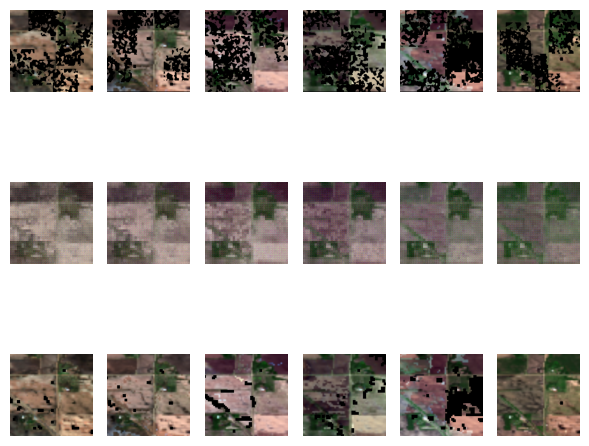

Epoch 7, Train loss.: 7.5598e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.078481175..1.0233346].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07582146..1.0413465].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04747446..0.74214166].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055005312..0.859056].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016456801..0.8387602].


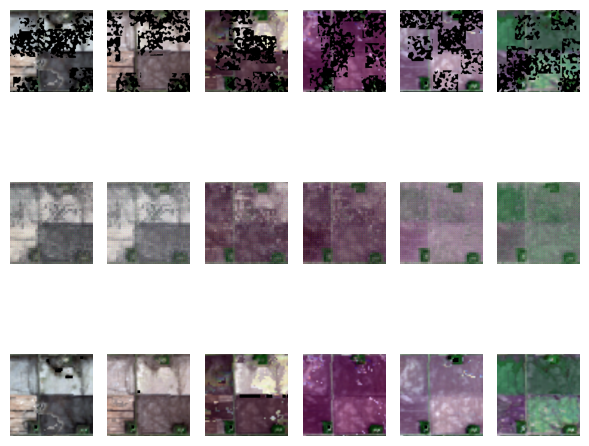

Epoch 8, Train loss.: 7.2835e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08938741..0.85182446].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.089660615..0.78513026].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.163949..0.70625603].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.089671955..0.6343362].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17167202..0.58123994].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1318784..0.51522046].


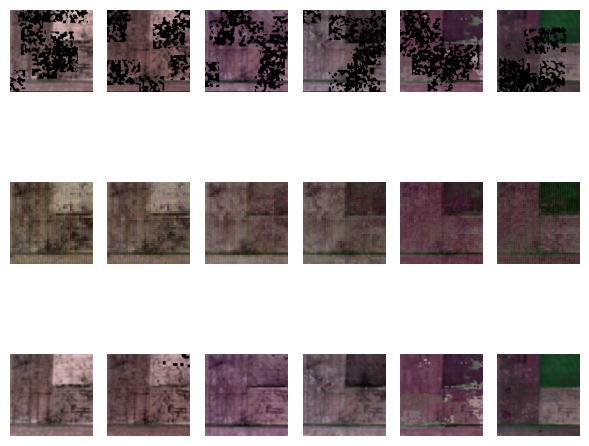

Epoch 9, Train loss.: 7.4674e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.111215584..0.8224131].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09469457..0.80067897].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06926184..0.8205844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024892975..0.9253848].


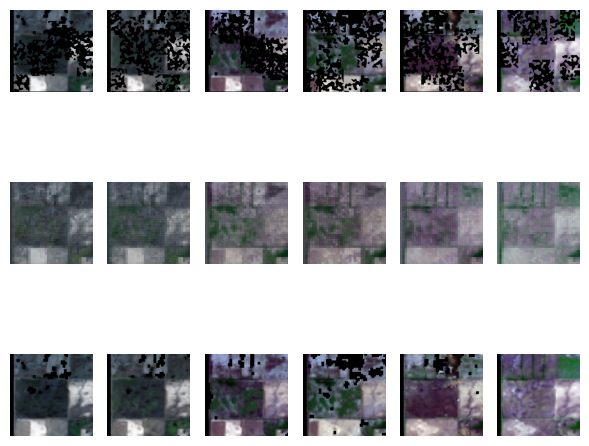

Epoch 10, Train loss.: 6.8581e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.14622843..1.0077707].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07708267..0.97243875].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11141035..0.92008555].


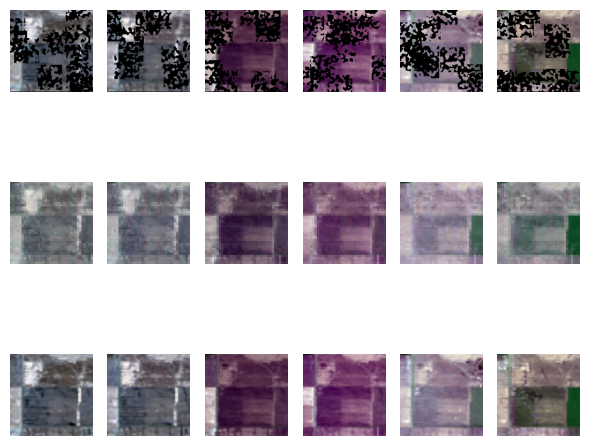

Epoch 11, Train loss.: 6.6246e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10232728..0.79682094].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13618137..0.7433656].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12365923..0.7923864].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09855943..0.6848149].


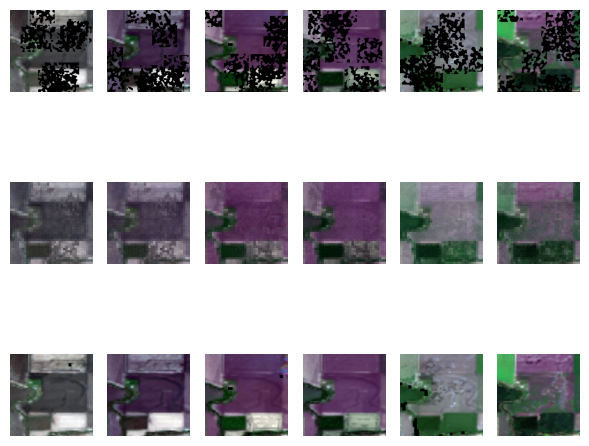

Epoch 12, Train loss.: 6.4439e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016384307..0.8594964].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0023408777..0.8165521].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0049424977..0.8820975].


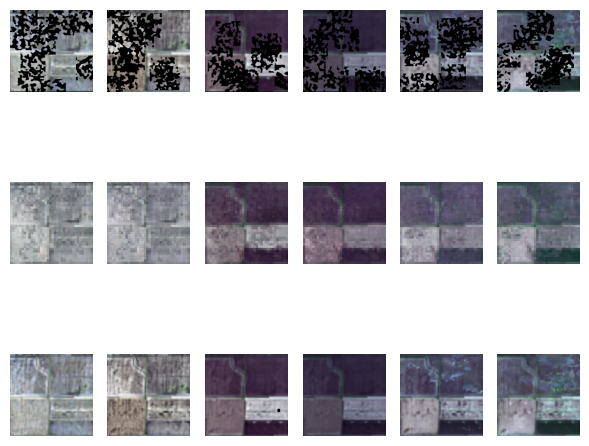

Epoch 13, Train loss.: 6.2828e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16913329..1.1911501].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14803192..1.1978964].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18254597..1.2046628].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22285146..1.062928].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32347727..1.4156044].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22435836..1.3096317].


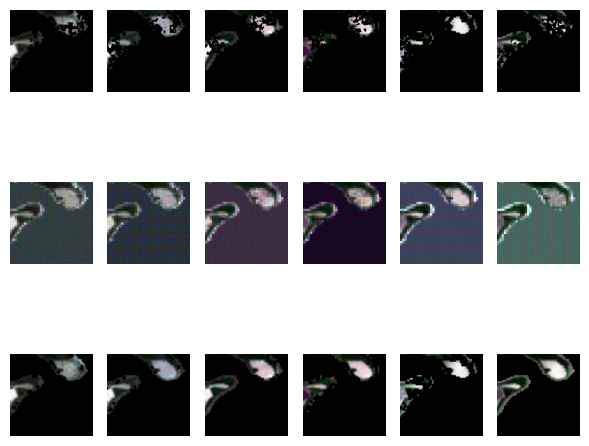

Epoch 14, Train loss.: 5.9660e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.091784805..0.71637446].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.033815563..0.72484165].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14157778..0.7181986].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14227924..0.59970224].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.107078955..0.5449149].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07842289..0.5681657].


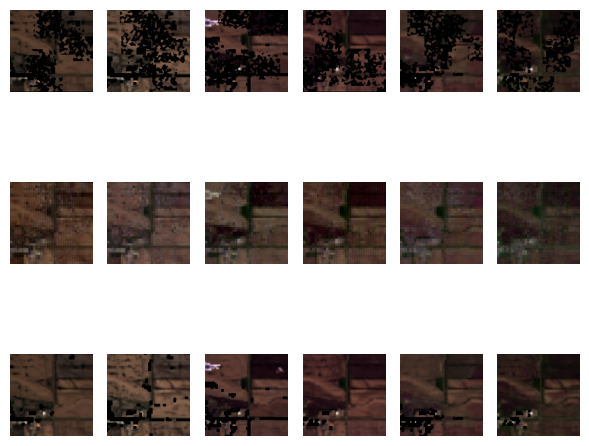

Epoch 15, Train loss.: 5.9318e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09050003..0.7412778].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06381416..0.7577024].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.095385574..0.7345362].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09883404..0.7269502].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.084452964..0.7890447].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09009902..0.68070424].


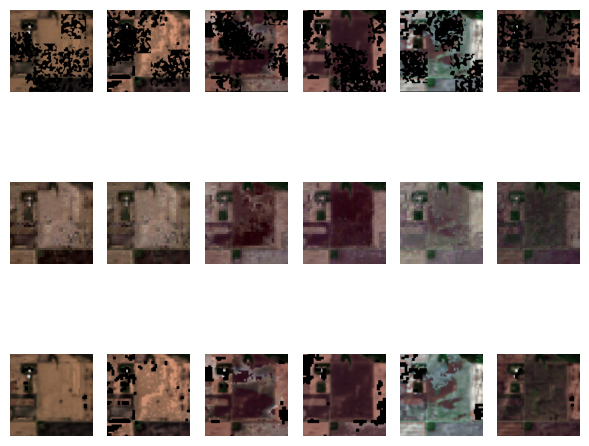

Epoch 16, Train loss.: 5.8462e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.047742523..1.0055676].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029027525..0.98052204].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10049708..0.9274203].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08825652..0.92582774].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15550268..0.91613466].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09148036..0.89048177].


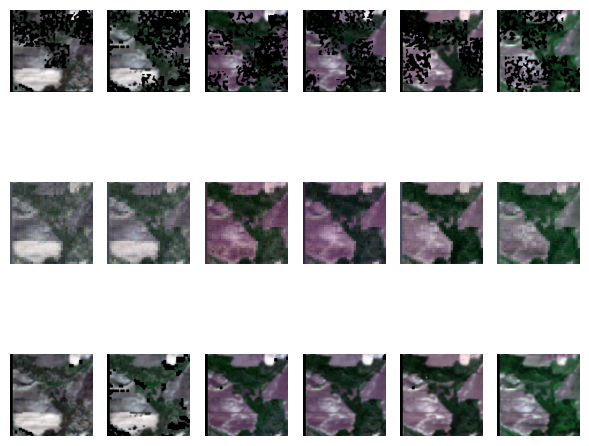

Epoch 17, Train loss.: 5.7195e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011197448..1.0202086].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08066424..1.0479561].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.018208217..1.0039172].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011866626..0.9929676].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.075380504..0.85481954].


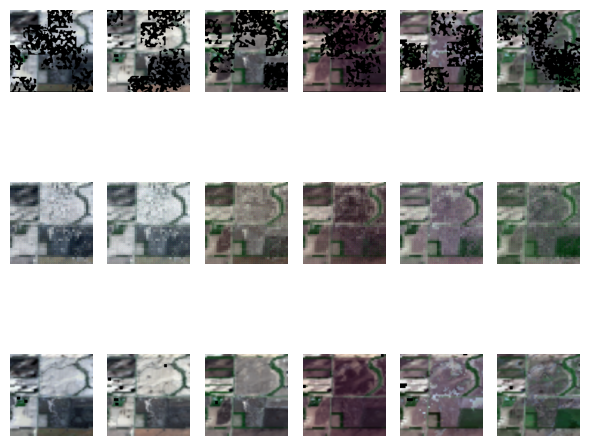

Epoch 18, Train loss.: 5.6058e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.069679044..0.9526633].


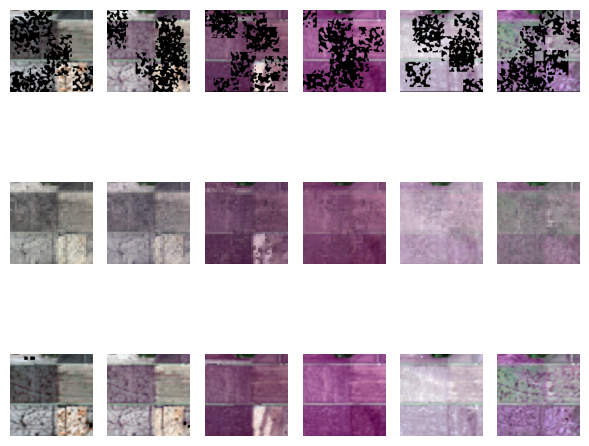

Epoch 19, Train loss.: 5.4852e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0017948034..1.0351882].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.009665567..1.0844822].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07571037..0.7236119].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.090507075..0.69541764].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03703251..0.81602067].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.042904712..0.7657743].


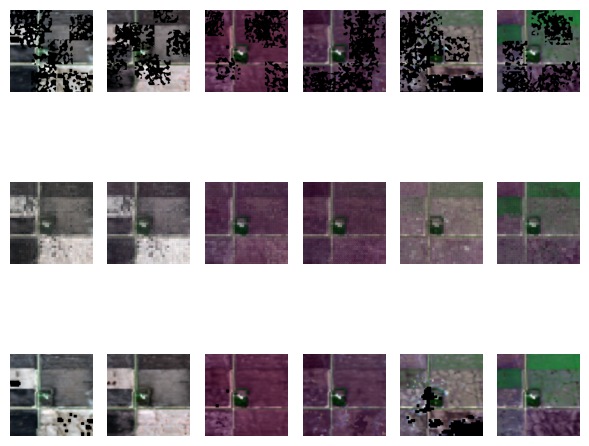

Epoch 20, Train loss.: 5.4182e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04721731..1.0106502].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06821919..0.9035255].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.077712454..0.863837].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13292554..0.9678295].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09918855..0.7667463].


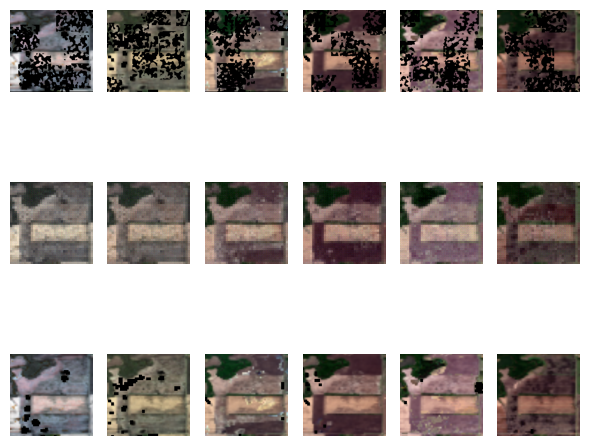

Epoch 21, Train loss.: 5.3016e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.12380265..1.1292375].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.013472425..1.1205059].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.063902564..0.9756362].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09455433..0.9552883].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12287924..0.95771676].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1284035..0.86895883].


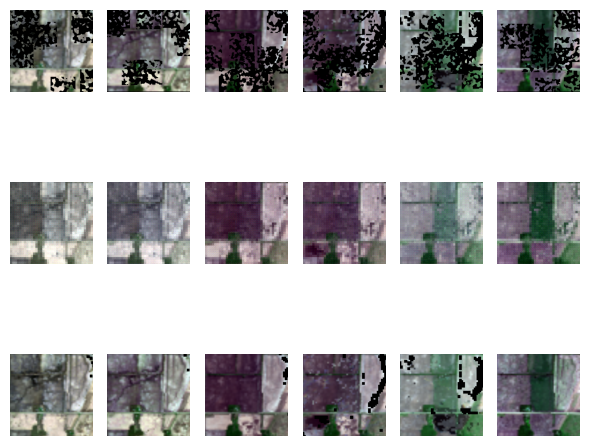

Epoch 22, Train loss.: 5.2357e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05891813..1.1261156].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.18004684..1.0621959].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03184541..0.8718737].


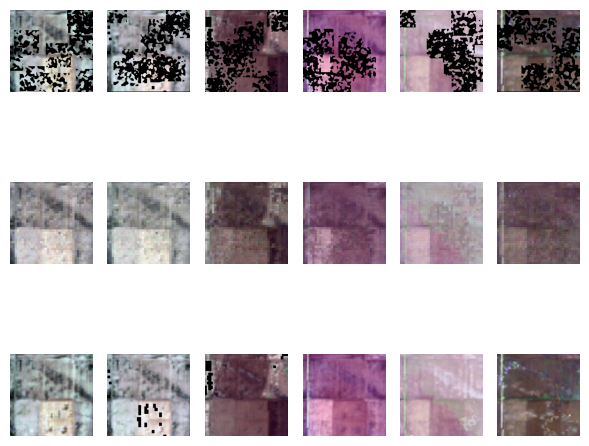

Epoch 23, Train loss.: 5.1707e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013781899..0.8971849].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10295298..0.9250856].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10003016..0.9266797].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06573935..0.8904169].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.039859727..0.85945356].


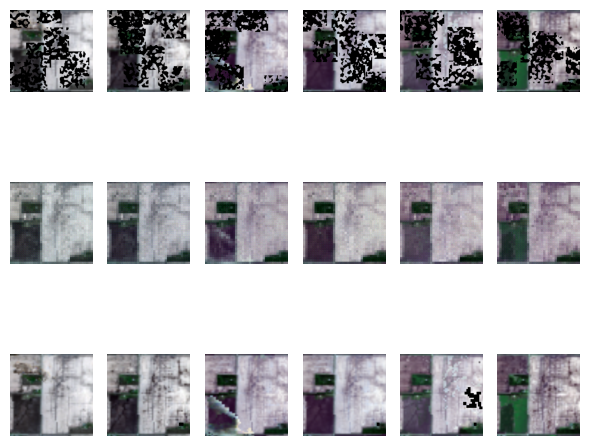

Epoch 24, Train loss.: 5.0976e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07515031..0.62783766].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04820105..0.7053837].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10075388..0.73235834].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18482982..0.6929356].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034085188..0.7100149].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09074268..0.5622446].


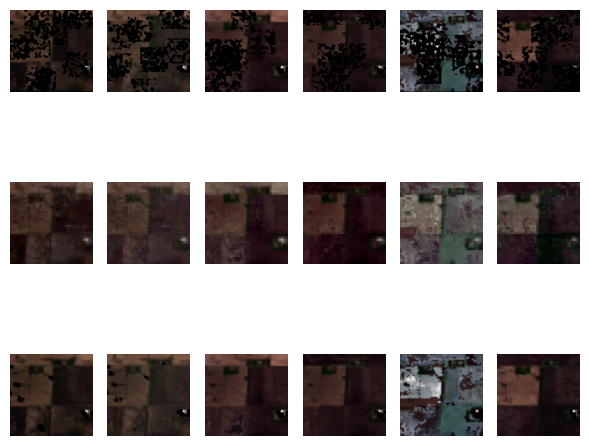

Epoch 25, Train loss.: 5.0435e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0026224302..0.88556606].


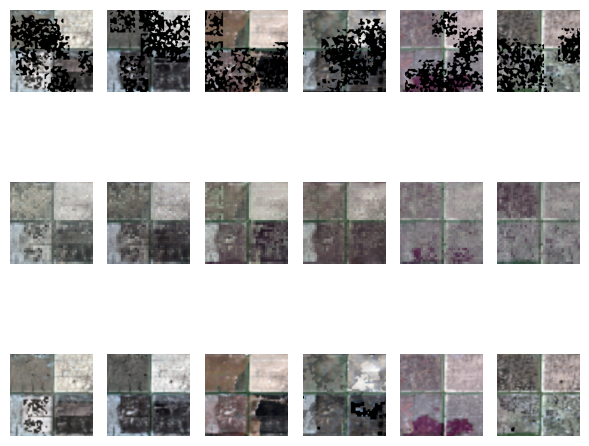

Epoch 26, Train loss.: 4.9647e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.063103534..1.0490371].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009412297..0.9564069].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.093693644..0.94220793].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0937922..0.9866097].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07540445..0.91851044].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.087195955..0.85704094].


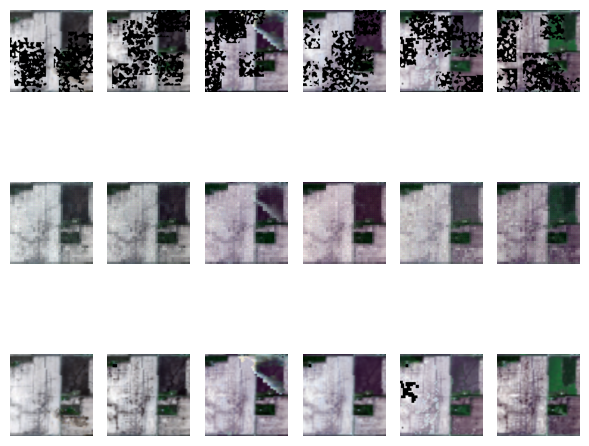

Epoch 27, Train loss.: 4.9354e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06473199..0.95542556].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060191214..0.9399733].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.057959974..0.95190746].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.052210566..1.1031705].


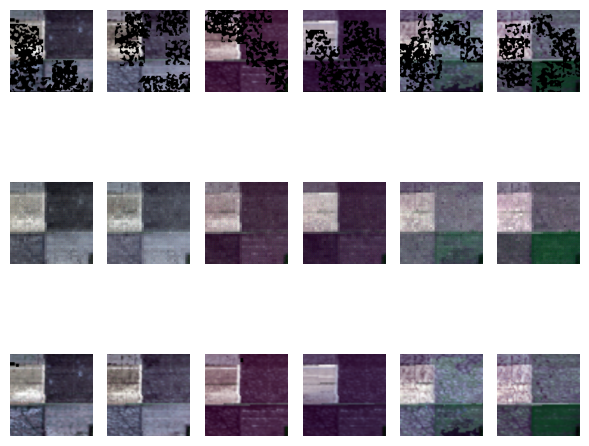

Epoch 28, Train loss.: 4.8619e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.058120202..0.67110896].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.061223082..0.60184395].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.074174374..0.6020258].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05255124..0.49451295].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13953057..0.49106556].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.053838626..0.55751073].


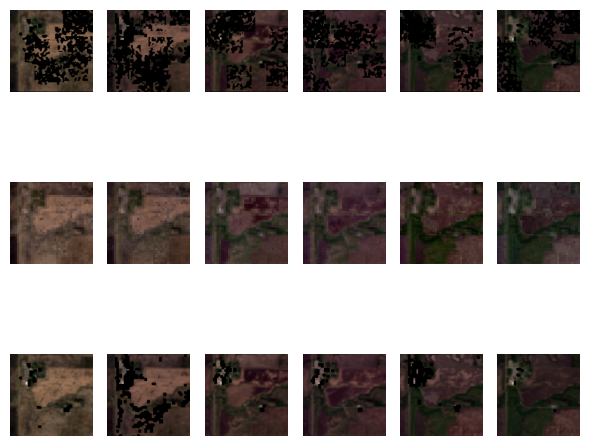

Epoch 29, Train loss.: 4.8186e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.021847205..1.0364288].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.058271047..1.0219586].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08727418..0.9441127].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07737268..1.004391].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.030763451..0.97332907].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0407337..0.8639327].


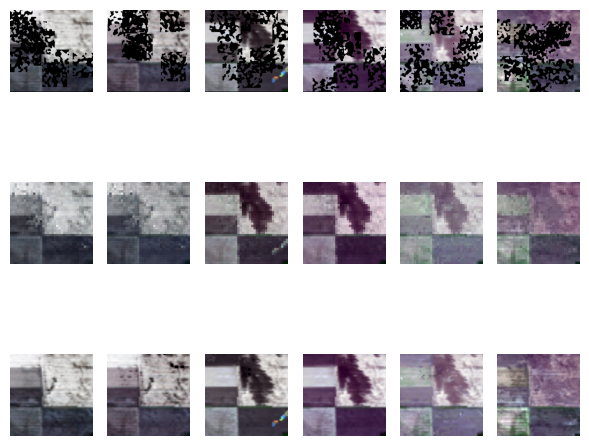

Epoch 30, Train loss.: 4.7549e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03771766..0.9781116].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008849792..1.0378261].


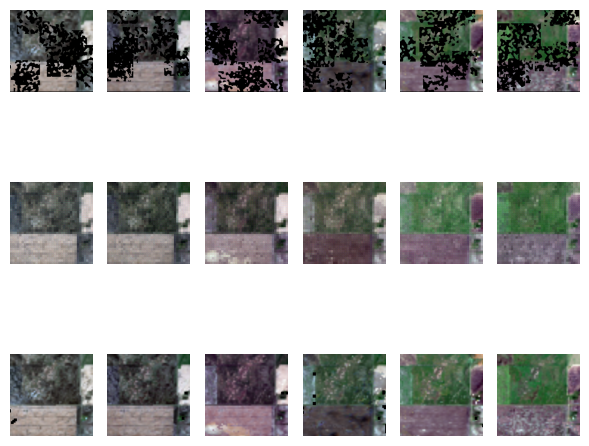

Epoch 31, Train loss.: 4.7130e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0008847085..0.71475416].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10593716..0.7922316].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11292764..0.8535585].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15439059..0.522172].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056181982..0.610538].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07107454..0.45712823].


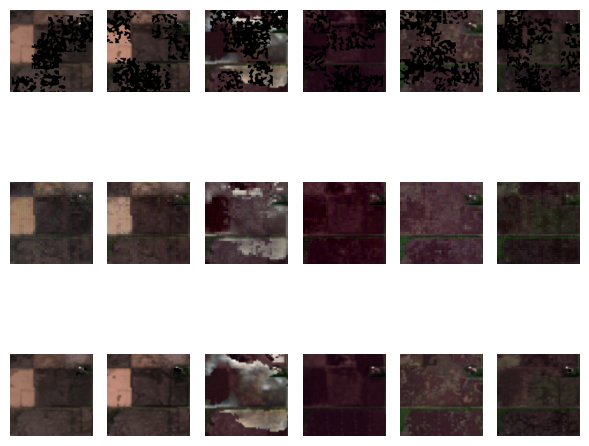

Epoch 32, Train loss.: 4.6872e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08532682..1.0516894].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.13287492..1.0354835].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01148135..0.9859354].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03304261..0.9591413].


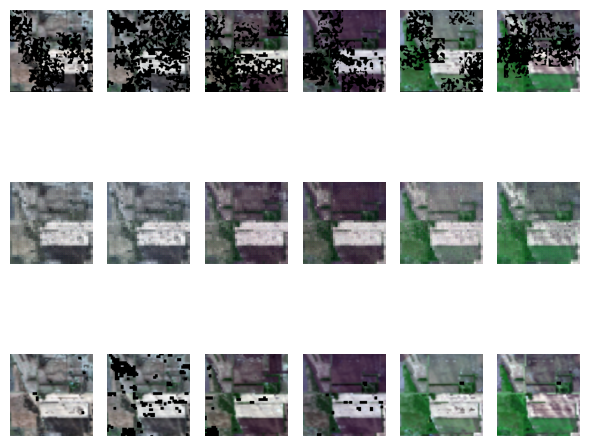

Epoch 33, Train loss.: 4.6624e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07772294..1.0152501].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006220376..0.97835964].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1593736..0.9961698].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047425244..1.0154846].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022944562..1.0360079].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09498929..0.94184226].


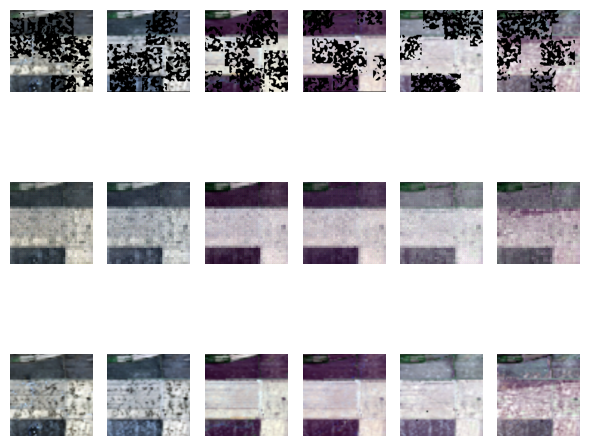

Epoch 34, Train loss.: 4.6108e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.044634864..0.7423869].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.018411512..1.0651126].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.057628844..0.9517148].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008314773..1.05148].


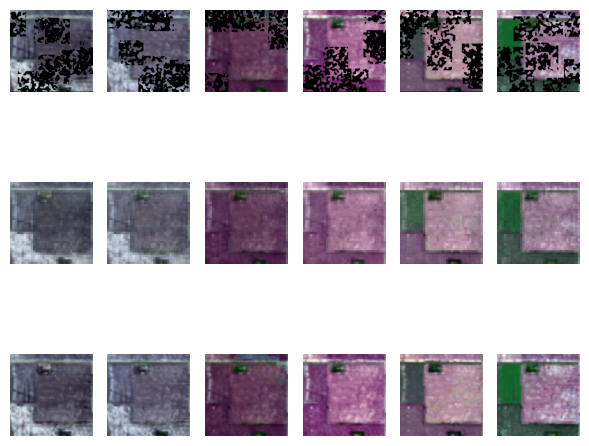

Epoch 35, Train loss.: 4.5730e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0015444139..0.94693774].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022185398..0.91039044].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029028542..0.9328106].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017684687..0.85493326].


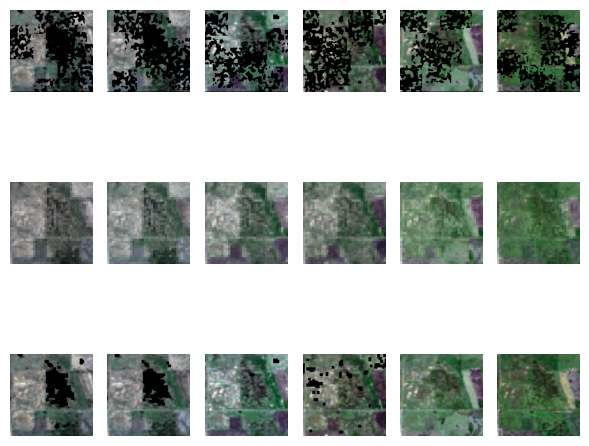

Epoch 36, Train loss.: 4.5292e-01


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06388705..0.7302325].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13969804..0.7963925].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.091189936..0.6853996].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04380263..0.8212896].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.103265814..0.8476962].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08808111..0.674684].


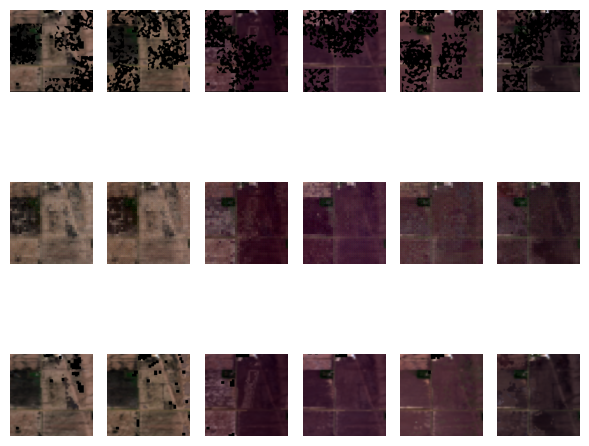

Epoch 37, Train loss.: 4.5491e-01


KeyboardInterrupt: 

In [ ]:
# --------------------------------------------------------------------
# Start to train the model
# --------------------------------------------------------------------

# ----------- discriminator parameters to test Adverserial loss addition to the network

for epoch in range(0, epoch):  # loop over the dataset multiple times
    model.train()
    train_loss = 0.0

    for i, data in enumerate(trainloader):
        inputs, targets, cloud_mask, added_cloud_mask = data
        channel_each = inputs.shape[1] // time_span
        last_time_start = channel_each * (time_span - 1)
        last_time_end = channel_each * time_span
        optimizerG.zero_grad()
        outputs = model(inputs.to(device))
        # Apply cloud_mask to outputs and targets
        expanded_cloud_mask = cloud_mask.repeat_interleave(
            model.net.in_chans // time_span, dim=1
        )

        masked_outputs = outputs * expanded_cloud_mask.to(device)
        masked_targets = targets.to(device) * expanded_cloud_mask.to(device)
        
        valid_pixels_total = cloud_mask.sum()
        valid_pixel_counts = cloud_mask.sum(dim=(0, 2, 3))
        max_valid_pixel_index = np.argmax(valid_pixel_counts)
        last_time_start = max_valid_pixel_index * 11
        last_time_end = last_time_start + 11
        if valid_pixels_total > 0:
            loss = criterion(
                masked_outputs.to(device),
                masked_targets.to(device),
            )
        else:
            loss = torch.tensor(0.0, device=device, requires_grad=True)
        # loss = criterion(
        #     outputs, targets.to(device), torch.tensor([1.0], device=device)
        # )
        # loss = criterion(outputs, targets.to(device))
        loss.backward()
        torch.nn.utils.clip_grad_norm_(
            model.parameters(), max_norm=1, norm_type=1, error_if_nonfinite=True
        )
        optimizerG.step()

        train_loss += loss.item()

    model.eval()
    with torch.no_grad():
        random_indices = random.sample(range(0, 5), 1)
        for i, (inputs, targets, cloud_mask, cloud_mask_added) in enumerate(valloader):
            if i in random_indices:  # 使用随机索引选择一些样本进行可视化
                # 获取模型输出
                outputs = model(inputs.to(device)).cpu()

                input_images, _ = create_time_series_pseudo_color_image(
                    inputs[0, :, :, :].squeeze(0),
                    cloud_mask[0, :, :, :].squeeze(0),
                    cloud_mask_added[0, :, :, :].squeeze(0),
                )
                output_images, _ = create_time_series_pseudo_color_image(
                    outputs[0, :, :, :].squeeze(0),
                    cloud_mask[0, :, :, :].squeeze(0),
                    cloud_mask_added[0, :, :, :].squeeze(0),
                )
                targets_images, _ = create_time_series_pseudo_color_image(
                    targets[0, :, :, :].squeeze(0),
                    cloud_mask[0, :, :, :].squeeze(0),
                    cloud_mask_added[0, :, :, :].squeeze(0),
                )

                all_images = [
                    input_images,
                    output_images,
                    targets_images,
                ]

                # 绘制图像
                fig, axes = plt.subplots(
                    len(all_images), len(targets_images), figsize=(6, 6)
                )

                for i, image_list in enumerate(all_images):
                    for j in range(len(image_list)):
                        axes[i][j].imshow(image_list[j])
                        axes[i][j].axis("off")
                        # 可选：为每行图像设置标题
                        # if j == 0:
                        #     axes[i][j].set_title("Row Title")

                plt.tight_layout()
                plt.show()
                break  # 只显示一个 batch 的可视化

    scheduler.step()
    train_hist.append(train_loss / len(trainloader))
    save_model(path, model, train_hist, optimizerG, scheduler=scheduler)
    print("Epoch {}, Train loss.: {:0.4e}".format(epoch + 1, train_hist[-1]))

*********** Testing ************ 2024-12-30 18:21:33.883044


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.017798..0.4892971].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0196087..0.49624515].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0151094..0.46826604].


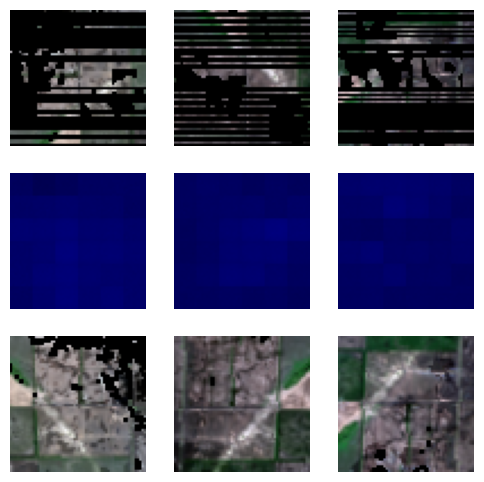

In [ ]:
# --------------------------------------------------------------------
# Test the model trained
print("*********** Testing ************", datetime.now())
# --------------------------------------------------------------------

"""Example reconstructions"""
valloader = DataLoader(
    val_dataset,
    batch_size=1,
    shuffle=True,
    num_workers=0,
    generator=torch.Generator().manual_seed(1),
)
dataiter = iter(valloader)
model.eval()
maxval = torch.tensor([1.0], device="cpu")

ssim_clean = []
ssim_noise = []
psnr_clean = []
psnr_noise = []
nmse_clean = []
nmse_noise = []

random_indices = random.sample(range(25, 30), 1)

with torch.no_grad():
    for i, _ in enumerate(valloader):
        if i in random_indices:
            inputs, targets, cloud_mask, cloud_mask_added = next(dataiter)
            outputs = model(inputs.to(device)).cpu()
            # img_input = inputs_[0].numpy()

            input_images, _ = create_time_series_pseudo_color_image(
                inputs.squeeze(0), cloud_mask.squeeze(0), cloud_mask_added.squeeze(0)
            )

            output_images, _ = create_time_series_pseudo_color_image(
                outputs.squeeze(0), cloud_mask.squeeze(0), cloud_mask_added.squeeze(0)
            )

            targets_images, _ = create_time_series_pseudo_color_image(
                targets.squeeze(0), cloud_mask.squeeze(0), cloud_mask_added.squeeze(0)
            )

            all_images = [
                input_images,
                output_images,
                targets_images,
            ]

            fig, axes = plt.subplots(
                len(all_images), len(targets_images), figsize=(6, 6)
            )

            for i, image_list in enumerate(all_images):
                for j in range(len(image_list)):
                    axes[i][j].imshow(image_list[j])
                    axes[i][j].axis("off")
                    # if j == 0:  # Add a title only to the first image of each row
                    #     axes[i][j].set_title(title)

            # plt.tight_layout()
            # plt.show()
            # plt.axis("off")
            # plt.savefig("output/imagenet_after_spt" + ".png")

            # ssim_clean.append(ms_ssim(targets, outputs, maxval[0].item()))
            # ssim_noise.append(ms_ssim(targets, inputs_, maxval[0].item()))
            # psnr_clean.append(psnr(targets[0], outputs[0], maxval[0].item()))
            # psnr_noise.append(psnr(targets[0], inputs_[0], maxval[0].item()))
            # nmse_clean.append(
            #     nmse(
            #         targets[0],
            #         outputs[0],
            #     )
            # )
            # nmse_noise.append(nmse(targets, inputs_))

    # output_stat = pd.DataFrame()
    # output_stat["ssim_clean"] = ssim_clean
    # output_stat["ssim_noise"] = ssim_noise
    # # output_stat["psnr_clean"] = psnr_clean
    # # output_stat["psnr_noise"] = psnr_noise
    # # output_stat["nmse_clean"] = nmse_clean
    # # output_stat["nmse_noise"] = nmse_noise
    # output_stat.to_csv("output/breakdown.csv")
    # output_stat = output_stat.applymap(
    #     lambda x: x.item() if isinstance(x, torch.Tensor) else x
    # )

    # # output_stat = pd.read_csv("output/testing_metrics.csv")
    # testing_metrics = output_stat.mean(axis=0)
    # output_stat = pd.concat([output_stat, testing_metrics])
    # testing_metrics.to_csv("output/testing_metrics.csv")

    # print(" ssim:", testing_metrics["ssim_clean"])
    # print("*ssim:", testing_metrics["ssim_noise"])
    # print(" psnr:", testing_metrics["psnr_clean"])
    # print("*psnr:", testing_metrics["psnr_noise"])
    # print(" nmse:", testing_metrics["nmse_clean"])
    # print("*nmse:", testing_metrics["nmse_noise"])

# print("*********** ENDED AT ************", datetime.now())

# --------------------------------------------------------------------
# Completed running a ViT network with Imagenet dataset
# --------------------------------------------------------------------